## Comparing Spec2Vec 10 times in different space dimensions

## All comparison plots of Cosine with NIST, MassBank and Demuth powers and Spec2Vec are being plotted

The following space dimensionalities were used: 2, 50, 100, 300, 500, 600, 650, 700, 750, 800, 100 and 1200.

The diagonal is ignored every time the percentile value is obtained.


In [24]:
import os
import sys

ROOT = os.path.dirname(os.getcwd())
sys.path.insert(0, ROOT)

In [25]:
from custom_functions.spectra_functions import get_data_folder_path

path = get_data_folder_path()

## Retrieving Tanimoto similarity scores

In [3]:
import numpy as np 

filename = os.path.join(path, "gcms_similarities_filter05_morgan3_2048_dice.npy")
matrix_similarities_tanimoto = np.load(filename)

In [4]:
filename = os.path.join(path,'similarities_filter05_cosine_tol05_mzp3_intp06.npy')
matrix_similarities_nist = np.load(filename)

In [5]:
filename = os.path.join(path,'similarities_filt05_cosine_tol05_mzp2_intp05.npy')
matrix_similarities_massbank = np.load(filename)

In [6]:
filename = os.path.join(path,'similarities_filt05_cosine_tol05_mzp0_intp033.npy')
matrix_similarities_demuth = np.load(filename)

## Method to obtain the average similarity score of certain percentile

In [7]:
from custom_functions.plotting_functions import plot_precentile

percentile = 0.007

percentile_cosine_nist = plot_precentile(matrix_similarities_tanimoto, matrix_similarities_nist, show_top_percentile=percentile, title="Cosine NIST Top Percentil Comparison", ignore_diagonal=True)


In [8]:

percentile_cosine_massbank = plot_precentile(matrix_similarities_tanimoto, matrix_similarities_massbank, show_top_percentile=percentile, title="Cosine MassBank Top Percentil Comparison", ignore_diagonal=True)


In [9]:

percentile_cosine_demuth = plot_precentile(matrix_similarities_tanimoto, matrix_similarities_demuth, show_top_percentile=percentile, title="Cosine Demuth Top Percentil Comparison", ignore_diagonal=True)


In [58]:
import matplotlib.pyplot as plt

def plot_spec2vec_comparison(percentile_cosine_nist, percentile_cosine_massbank,
                             percentile_cosine_demuth, percentile_cosine_spec2vec,
                             title=None):
    ## Code inspired by Florian Huber's jupyter notebook to plot a graph comparing all similarity meaasures
    ## https://github.com/iomega/spec2vec_gnps_data_analysis/blob/master/notebooks/iomega-7-compare-the-different-scores.ipynb

    num_bins = 1000

    plt.style.use('ggplot')
    fig, ax = plt.subplots(figsize=(7,6))

    x_percentiles = (percentile / num_bins * (1 + np.arange(num_bins)))[::-1]

    plt.plot(x_percentiles, percentile_cosine_nist,
             color="black", label="1) Cosine Greedy - NIST")
    plt.plot(x_percentiles, percentile_cosine_massbank,
             color="blue", label="2) Cosine Greedy - MassBank")
    plt.plot(x_percentiles, percentile_cosine_demuth,
             color="green", label="3) Cosine Greedy - Demuth")
    plt.plot(x_percentiles, percentile_cosine_spec2vec,
             color="red", label="4) Spec2vec")

    if title is not None:
        plt.suptitle(title)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xticks(np.linspace(0, percentile, 5), 
              ["{:.3f}%".format(x) for x in np.linspace(0, percentile, 5)])
    plt.legend()
    plt.xlabel("Top percentile of spectral similarity score g(s1,s2)", fontsize=13)
    plt.ylabel("Mean molecular similarity f(m1,m2) \n (within respective percentile)", fontsize=13)
#     plt.xlim(0, percentile)
#     plt.ylim(0.25, 1)
    plt.show()
    # plt.savefig(os.path.join(path, "Benchmarking_top_percentil_comparison_filter05_size100.png"))

In [20]:
x_dimensions = [2, 50, 100, 300, 500, 600, 650, 700, 750, 800, 1000, 1200]
percentile = 0.01
ten_iterations = []
count = 0

for idx in range(10):
    percentile_cosine_spec2vec2_list = []
    for k, dimension in enumerate(x_dimensions):
        matrix_filename = "similarities_filter05_spec2vec_it{:d}_size{:d}.npy".format(idx+1, dimension)
        filename = os.path.join(path, matrix_filename)
        similarity_matrix_spec2vec = np.load(filename)
        percentile_cosine_spec2vec2_list.append(plot_precentile(matrix_similarities_tanimoto, similarity_matrix_spec2vec, show_top_percentile=percentile, title="Spec2vec Top Percentil Comparison", ignore_diagonal=True))
        count += 1
        progress = (count / (10 * len(x_dimensions))) * 100
        print('\r', 'About {:.3f}% completed'.format(progress), end="")
    ten_iterations.append(percentile_cosine_spec2vec2_list)

# filename = os.path.join(path,'spec2vec_top_percentile1_10iterarions.npy')
# np.save(filename, ten_iterations)


 About 100.000% completed

In [21]:

percentile = 0.007
ten_iterations2 = []
count = 0

for idx in range(10):
    percentile_cosine_spec2vec2_list = []
    for k, dimension in enumerate(x_dimensions):
        matrix_filename = "similarities_filter05_spec2vec_it{:d}_size{:d}.npy".format(idx+1, dimension)
        filename = os.path.join(path, matrix_filename)
        similarity_matrix_spec2vec = np.load(filename)
        percentile_cosine_spec2vec2_list.append(plot_precentile(matrix_similarities_tanimoto, similarity_matrix_spec2vec, show_top_percentile=percentile, title="Spec2vec Top Percentil Comparison", ignore_diagonal=True))
        count += 1
        progress = (count / (10 * len(x_dimensions))) * 100
        print('\r', 'About {:.3f}% completed'.format(progress), end="")
    ten_iterations2.append(percentile_cosine_spec2vec2_list)

# filename = os.path.join(path,'spec2vec_top_percentile07_10iterarions.npy')
# np.save(filename, ten_iterations)


 About 100.000% completed

In [61]:
filename = os.path.join(path,'spec2vec_top_percentile1_10iterarions.npy')
np.save(filename, ten_iterations)

filename = os.path.join(path,'spec2vec_top_percentile07_10iterarions.npy')
np.save(filename, ten_iterations2)

In [62]:

filename = os.path.join(path,'spec2vec_top_percentile1_10iterarions.npy')
spec2vec_avg_sim_percentile1 = np.load(filename)

filename = os.path.join(path,'spec2vec_top_percentile07_10iterarions.npy')
spec2vec_avg_sim_percentile07 = np.load(filename)


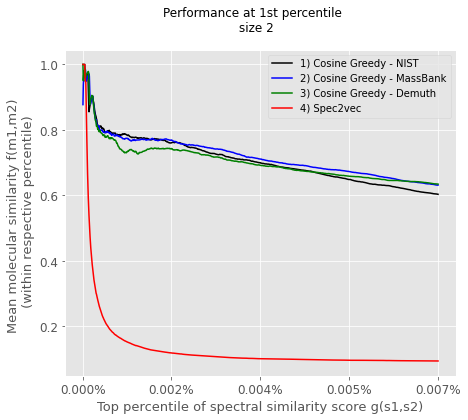

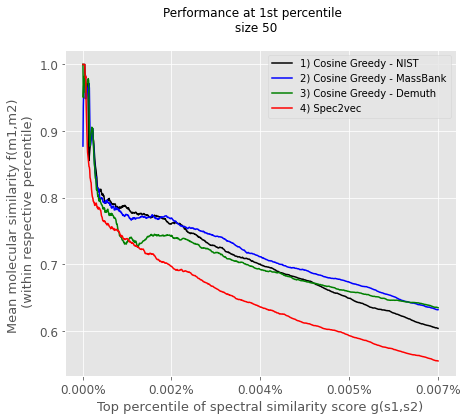

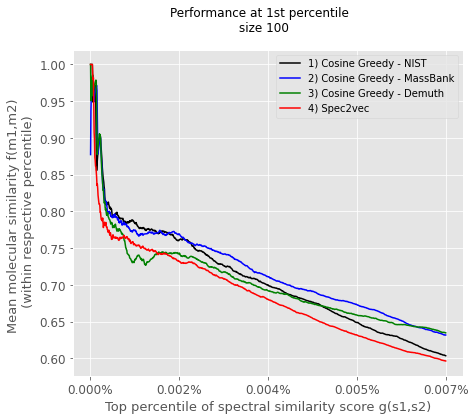

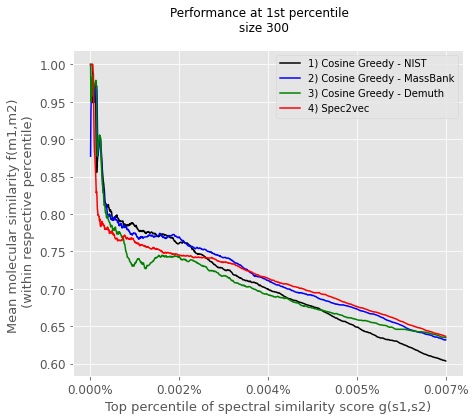

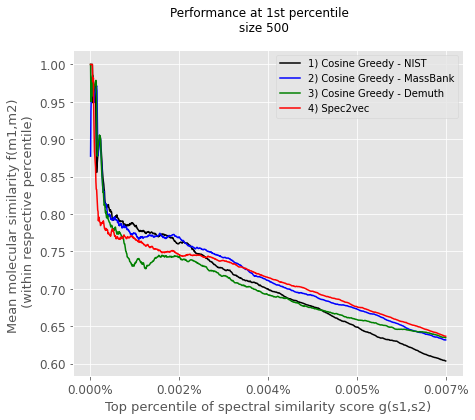

...

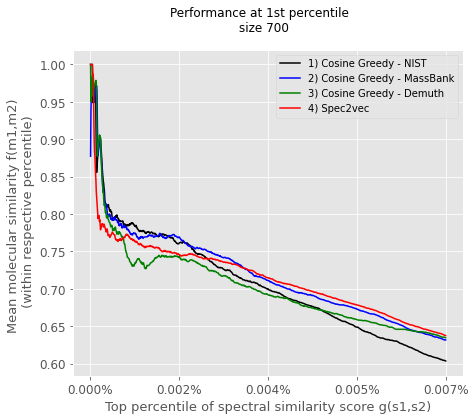

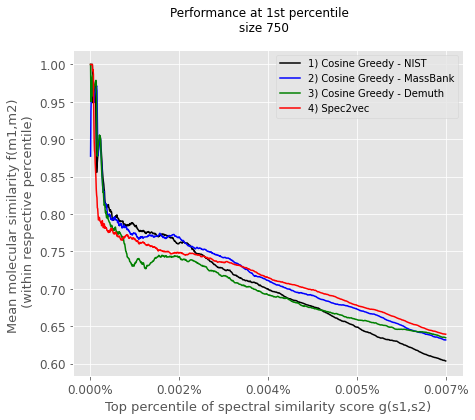

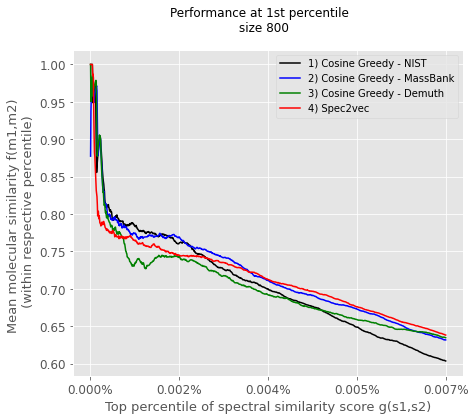

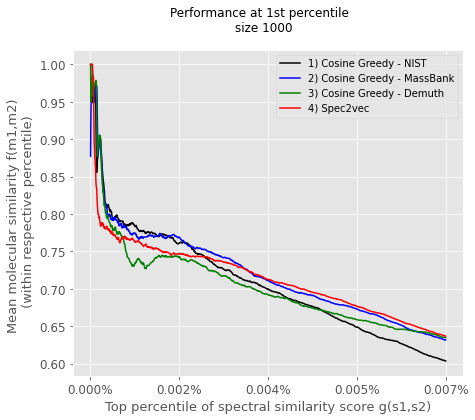

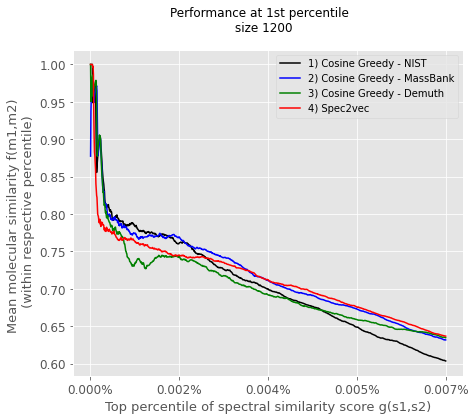

In [68]:
for iterations in spec2vec_avg_sim_percentile1:
    for k, spec2vec_avg_percentile in enumerate(iterations):
        plot_spec2vec_comparison(percentile_cosine_nist, percentile_cosine_massbank,
                                 percentile_cosine_demuth, spec2vec_avg_percentile, 
                                 title="Performance at 1st percentile \n size " + str(x_dimensions[k]))
    print("====================================")

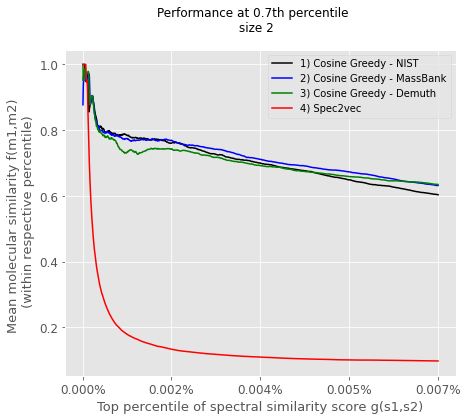

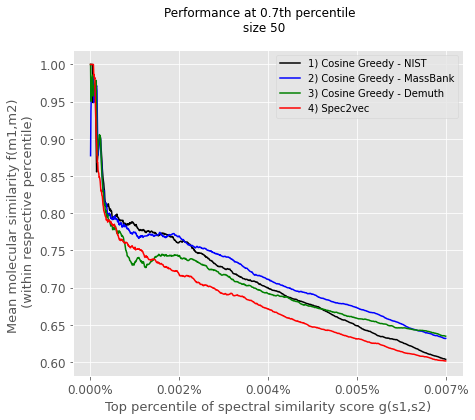

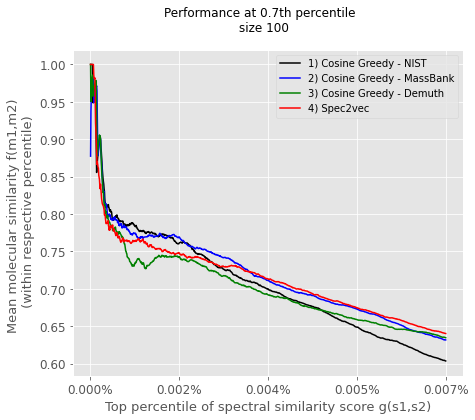

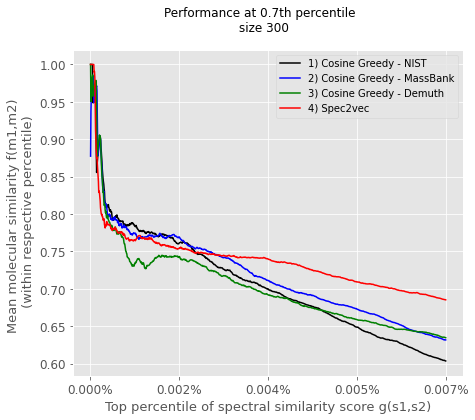

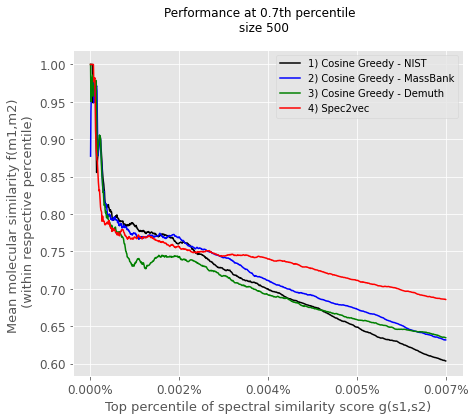

...

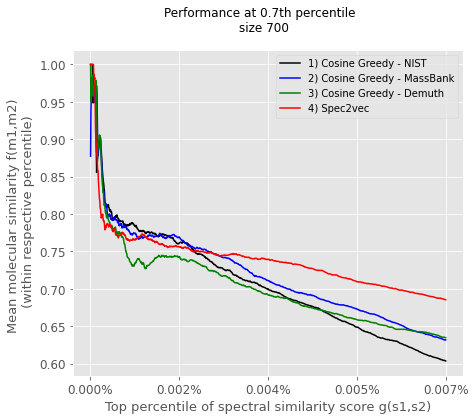

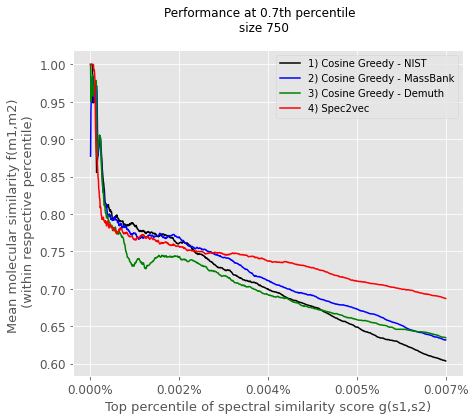

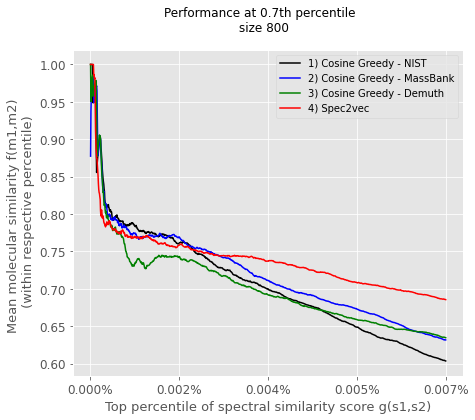

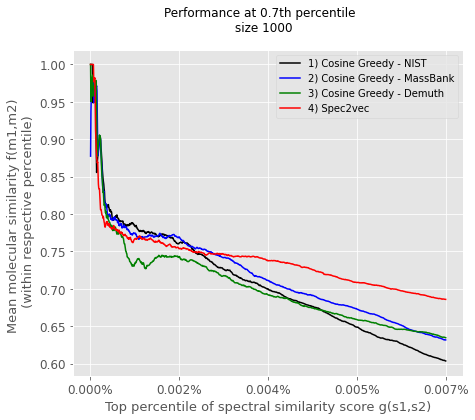

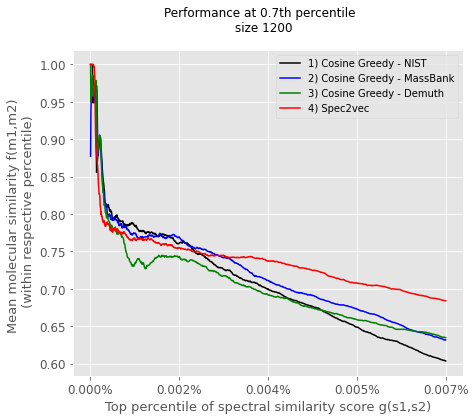

In [69]:
for iterations in spec2vec_avg_sim_percentile07:
    for k, spec2vec_avg_percentile in enumerate(iterations):
        plot_spec2vec_comparison(percentile_cosine_nist, percentile_cosine_massbank,
                                 percentile_cosine_demuth, spec2vec_avg_percentile,
                                 title="Performance at 0.7th percentile \n size " + str(x_dimensions[k]))
    print("====================================")